In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
%cd drive/MyDrive

/content/drive/MyDrive


In [ ]:
%cd Image Denoising

/content/drive/MyDrive/Image Denoising


In [ ]:
%cd REDNet

/content/drive/MyDrive/Image Denoising/REDNet


In [ ]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import os
import pathlib
from matplotlib import pyplot as plt
import seaborn as sns
import pickle
import pandas as pd
import numpy as np
import cv2
import skimage
from skimage.util import random_noise
import tensorflow as tf

from tqdm.notebook import tqdm
import random

In [ ]:
def get_images_paths(root_dir):
    # Getting dataset images
    root = pathlib.Path(root_dir)
    img_paths = list(root.rglob("*.png*"))
    img_paths_lst = [str(path) for path in img_paths]

    gt_lst = []
    noisy_lst= []
    for p in img_paths_lst:
        img_type = p.split("/")[-1].split('.')[0]
        if img_type=='199':
          continue
        noisy_lst.append(p)
    for o in img_paths_lst:
        img_type = o.split("/")[-1].split('.')[0]
        gt_lst.append(o)
    # print(gt_lst)
    gt_lst1 = []
    for i in gt_lst:
      img_type = i.split("/")[-1].split('.')[0]
      if img_type=='199':
        gt_lst1.append(i)

    gt_lst1 = (len(gt_lst)-1)*gt_lst1

    noisy_array = np.asarray(noisy_lst)
    gt_array = np.asarray(gt_lst1)
    return noisy_array, gt_array

In [ ]:
noisy_train_paths, gt_train_paths = get_images_paths("exp1/images/train")
noisy_test_paths, gt_test_paths = get_images_paths("exp1/images/test")

In [ ]:
print(noisy_train_paths.shape)
print(noisy_test_paths.shape)
print(gt_train_paths.shape)
print(gt_test_paths.shape)

(50,)
(12,)
(50,)
(12,)


In [ ]:
# Get gt_images in memory
def get_images_in_mem(images_paths):
    images_lst = []
    for img_path in tqdm(images_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        images_lst.append(img)
    return np.array(images_lst)

In [ ]:
noisy_train_images = get_images_in_mem(noisy_train_paths)
noisy_test_images = get_images_in_mem(noisy_test_paths)

gt_train_images = get_images_in_mem(gt_train_paths)
gt_test_images = get_images_in_mem(gt_test_paths)

print(noisy_train_images.shape)
print(noisy_test_images.shape)

print(gt_train_images.shape)
print(gt_test_images.shape)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

(50, 128, 128, 3)
(12, 128, 128, 3)
(50, 128, 128, 3)
(12, 128, 128, 3)


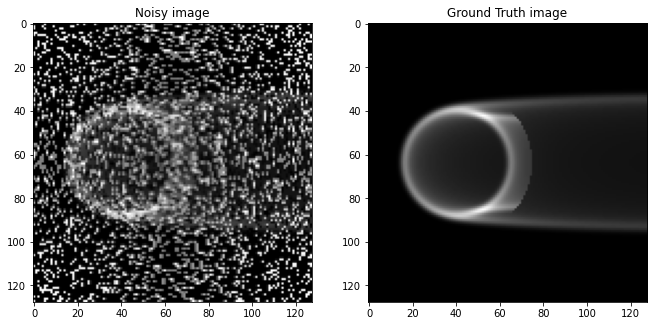

In [ ]:
f, axarr = plt.subplots(1,2, figsize=(11,11))
axarr[0].imshow(noisy_train_images[30])
axarr[0].set_title("Noisy image")
axarr[1].imshow(gt_train_images[30])
axarr[1].title.set_text("Ground Truth image")

In [ ]:
def tf_data_generator(X, y, batch_size=32):
    dataset = tf.data.Dataset.from_tensor_slices((X, y)) # This is the main step for data generation
    dataset = dataset.shuffle(1000, reshuffle_each_iteration=True)

    dataset = dataset.repeat()
    dataset = dataset.batch(batch_size=batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    return dataset

BATCH_SIZE=4

image_generator_train = tf_data_generator(X=noisy_train_images, y=gt_train_images, batch_size=BATCH_SIZE)
image_generator_test = tf_data_generator(X=noisy_test_images, y=gt_test_images, batch_size=BATCH_SIZE)

NameError: ignored

In [ ]:
image_generator_train

<PrefetchDataset element_spec=(TensorSpec(shape=(4, 128, 128, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(4, 128, 128, 3), dtype=tf.uint8, name=None))>

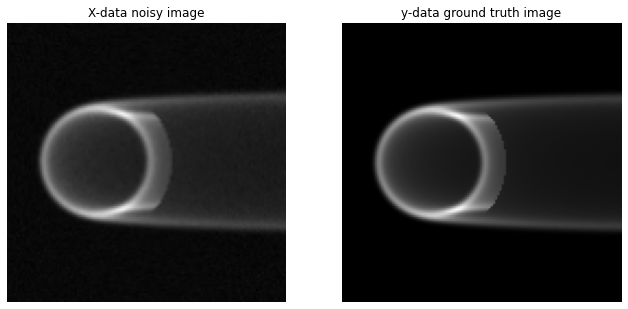

In [ ]:
# SANITY CHECK of the Dataset generator
for noisy, gt in image_generator_train.take(1):  # only take first element of dataset
    numpy_images = noisy.numpy()
    numpy_labels = gt.numpy()

f, axarr = plt.subplots(1,2, figsize=(11,11))
axarr[0].imshow(numpy_images[1])
axarr[0].set_title("X-data noisy image")
axarr[0].set_axis_off()

axarr[1].imshow(numpy_labels[1])
axarr[1].set_title("y-data ground truth image")
axarr[1].set_axis_off()

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, Add
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam

In [ ]:
def create_model():
    tf.keras.backend.clear_session()

    input_0 = Input(shape=(128,128,3), name="input_layer")
    conv_layer_1 = Conv2D(filters=256, kernel_size=2, padding='same', name="conv_1")(input_0)
    conv_layer_2 = Conv2D(filters=256, kernel_size=2, padding='same', name="conv_2")(conv_layer_1)
    conv_layer_3 = Conv2D(filters=256, kernel_size=3, padding='same', name="conv_3")(conv_layer_2)
    conv_layer_4 = Conv2D(filters=256, kernel_size=3, padding='same', name="conv_4")(conv_layer_3)
    conv_layer_5 = Conv2D(filters=128, kernel_size=3, padding='same', name="conv_5")(conv_layer_4)

    deconv_layer_5 = Conv2DTranspose(filters=256, kernel_size=2, padding='same', name="deconv_5")(conv_layer_5)
    deconv_layer_5 = Add(name="add_1")([conv_layer_4, deconv_layer_5])
    deconv_layer_4 = Conv2DTranspose(filters=256, kernel_size=2, padding='same', name="deconv_4")(deconv_layer_5)
    deconv_layer_3 = Conv2DTranspose(filters=256, kernel_size=3, padding='same', name="deconv_3")(deconv_layer_4)
    deconv_layer_3 = Add(name="add_2")([conv_layer_2, deconv_layer_3])
    deconv_layer_2 = Conv2DTranspose(filters=128, kernel_size=3, padding='same', name="deconv_2")(deconv_layer_3)
    deconv_layer_1 = Conv2DTranspose(filters=3, kernel_size=3, padding='same', name="deconv_1")(deconv_layer_2)
    out = Add(name="add_3")([input_0, deconv_layer_1])

    model = Model(inputs=[input_0], outputs=[out])
    return model

In [ ]:
model = create_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_layer (InputLayer)       [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_1 (Conv2D)                (None, 128, 128, 25  3328        ['input_layer[0][0]']            
                                6)                                                                
                                                                                                  
 conv_2 (Conv2D)                (None, 128, 128, 25  262400      ['conv_1[0][0]']                 
                                6)                                                            

In [ ]:
# steps_per_epoch_train = len(noisy_train_images)
# steps_per_epoch_validation = len(noisy_test_images)

In [ ]:
# best_models_path = "./"
# callbacks_lst = [
#     tf.keras.callbacks.ModelCheckpoint(filepath=best_models_path+"REDNet_exp1_100epochs.h5", period=10, save_weights_only=False),
#     tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.000009, min_delta=0.0001, factor=0.75, patience=3, verbose=1, mode='min'),
#     tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, min_delta=0.0001, patience=10)
# ]

In [ ]:
# model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0001))
# model.fit(image_generator_train,
#           validation_data=image_generator_test,
#                         steps_per_epoch=steps_per_epoch_train,
#                         validation_steps=steps_per_epoch_validation,
#                         epochs=100,
#                         verbose=1,
#                         callbacks=callbacks_lst)

Epoch 1/100
50/50 [==============================] - 27s 251ms/step - loss: 1275.6581 - val_loss: 724.2927 - lr: 1.0000e-04
Epoch 2/100
50/50 [==============================] - 12s 246ms/step - loss: 673.7718 - val_loss: 687.7180 - lr: 1.0000e-04
Epoch 3/100
50/50 [==============================] - 13s 255ms/step - loss: 654.9156 - val_loss: 672.0811 - lr: 1.0000e-04
Epoch 4/100
50/50 [==============================] - 13s 264ms/step - loss: 764.2121 - val_loss: 688.1008 - lr: 1.0000e-04
Epoch 5/100
50/50 [==============================] - 13s 263ms/step - loss: 622.2891 - val_loss: 639.5342 - lr: 1.0000e-04
Epoch 6/100
50/50 [==============================] - 13s 256ms/step - loss: 605.1129 - val_loss: 629.0341 - lr: 1.0000e-04
Epoch 7/100
50/50 [==============================] - 13s 251ms/step - loss: 599.8710 - val_loss: 631.4570 - lr: 1.0000e-04
Epoch 8/100
50/50 [==============================] - 13s 251ms/step - loss: 583.5710 - val_loss: 619.1580 - lr: 1.0000e-04
Epoch 9/100
50/

In [ ]:
# best_models_path = "./"
# model.save(best_models_path+"REDNet_exp1_100epochs.h5")

In [ ]:
# Inference
def inference_single_image(model, noisy_image):
    input_image = np.expand_dims(noisy_image, axis=0)
    predicted_image = model.predict(input_image)

    return predicted_image[0]

In [ ]:
def inference_batch_images(model, noisy_images):
    predicted_image = model.predict(noisy_images)
    return predicted_image

In [ ]:
def visualize_predictions(model, X_test, y_test, n):
    random_numbers = random.choices(range(X_test.shape[0]), k=n)    # Get n random indices
    for i in random_numbers:
        noisy_image = X_test[i]
        gt_image = y_test[i]
        predicted_image = inference_single_image(model, X_test[i])
        predicted_image/=255

        f, axarr = plt.subplots(1,3, figsize=(21,21))
        axarr[0].imshow(noisy_image)
        axarr[0].set_title("Noisy image")
        axarr[0].set_axis_off()
        axarr[1].imshow(gt_image)
        axarr[1].set_title("Ground truth image")
        axarr[1].set_axis_off()
        axarr[2].imshow(predicted_image)
        axarr[2].set_title("Predicted image")
        axarr[2].set_axis_off()

In [ ]:
best_models_path = "./"
model = tf.keras.models.load_model(best_models_path+'REDNet_exp1_100epochs.h5')

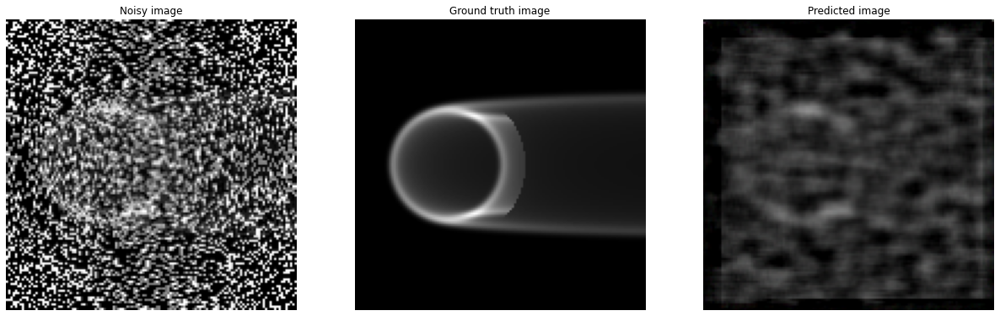

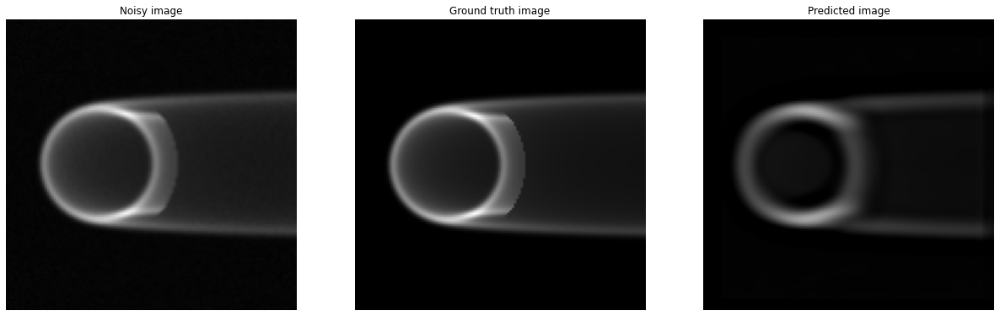

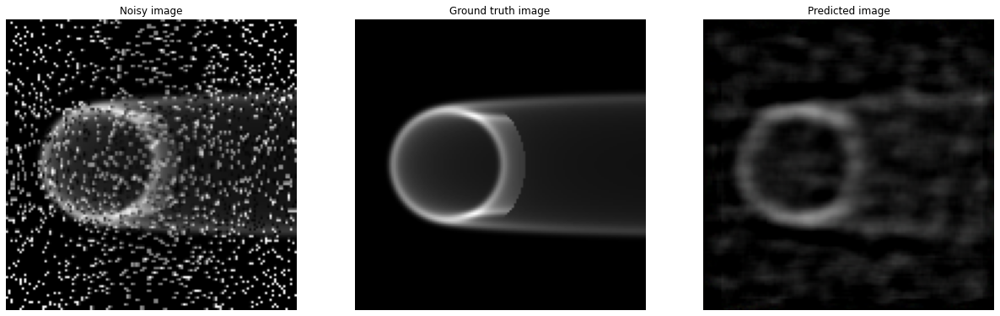

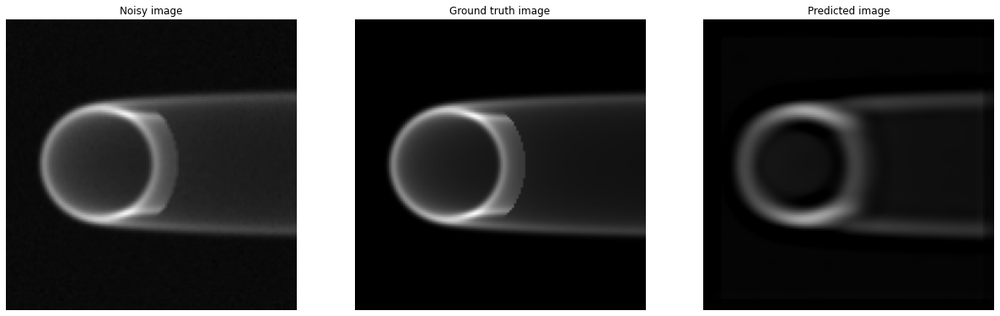

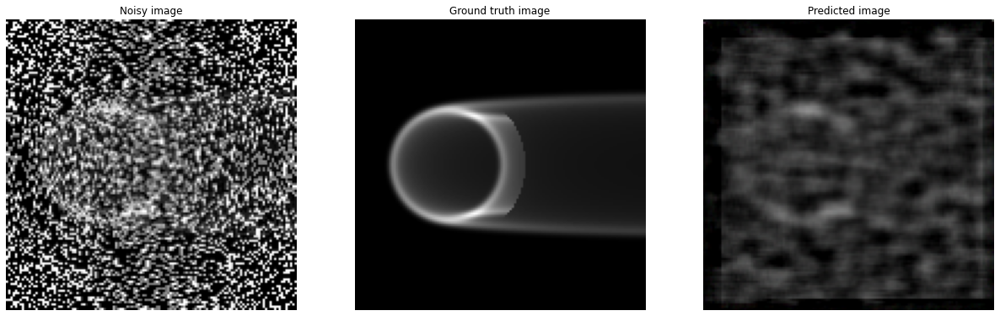

In [ ]:
visualize_predictions(model, noisy_test_images, gt_test_images, 5)

In [ ]:
from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images, noisy_test_images, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images.shape[0]
psnr_prediction_mean/=gt_test_images.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

Original average gt-noisy PSNR -> 22.40039628154723
Predicted average gt-predicted PSNR -> 22.504393542877654


In [ ]:
from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images, noisy_test_images, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images.shape[0]
ssim_prediction_mean/=gt_test_images.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)

Original average gt-noisy SSIM -> 0.3956737301791891
Predicted average gt-predicted SSIM -> 0.43572840869780105


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)


Original average gt-noisy PSNR -> 15.343191705424633
Predicted average gt-predicted PSNR -> 23.38640985058488
Original average gt-noisy SSIM -> 0.18388197985311727
Predicted average gt-predicted SSIM -> 0.3327497678256505


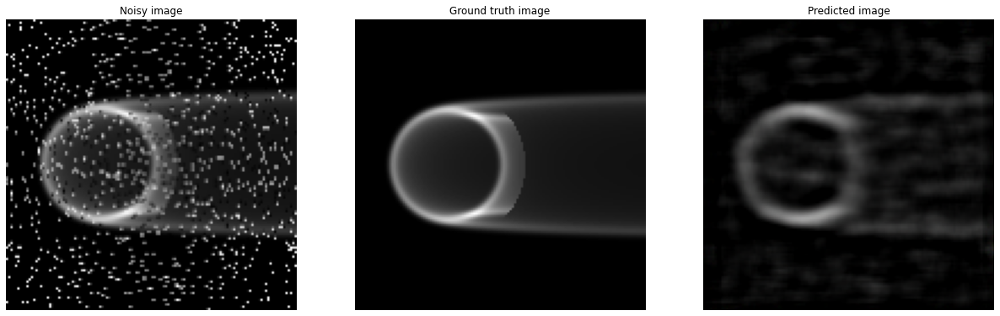

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s10")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 12.826926584045893
Predicted average gt-predicted PSNR -> 22.445159881833444
Original average gt-noisy SSIM -> 0.1031111614128446
Predicted average gt-predicted SSIM -> 0.28792333282868343


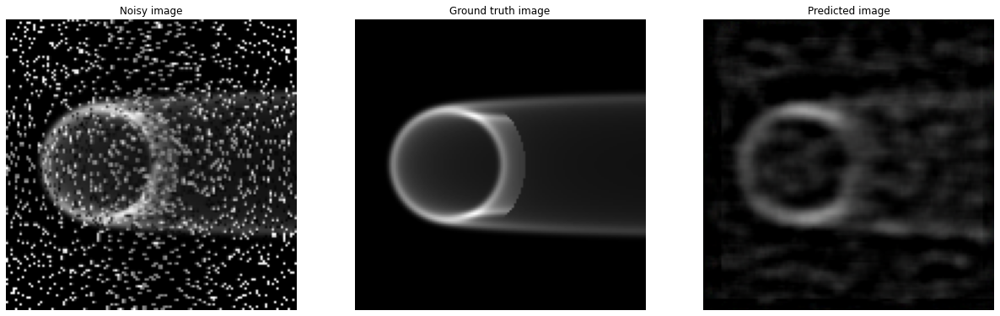

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s20")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 10.721734094321022
Predicted average gt-predicted PSNR -> 21.31177344987439
Original average gt-noisy SSIM -> 0.07440870057297067
Predicted average gt-predicted SSIM -> 0.2536590615774848


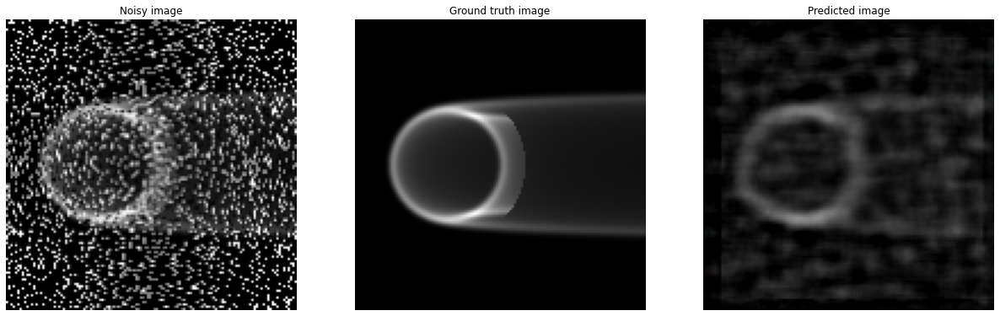

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s30")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 9.50256504536793
Predicted average gt-predicted PSNR -> 19.765863535309613
Original average gt-noisy SSIM -> 0.05138084032866618
Predicted average gt-predicted SSIM -> 0.19492592143212537


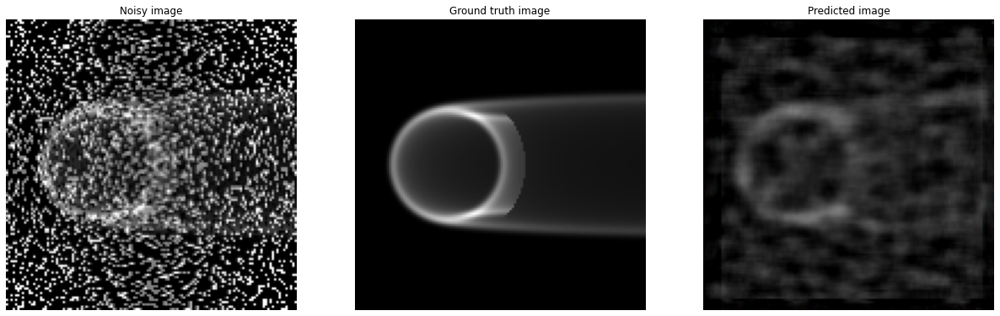

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 8.056858116531686
Predicted average gt-predicted PSNR -> 17.928271136067536
Original average gt-noisy SSIM -> 0.040401617502778486
Predicted average gt-predicted SSIM -> 0.16035451386969524


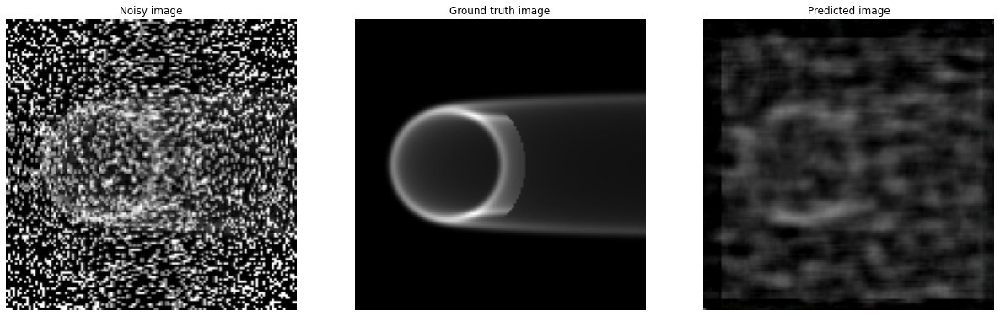

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s50")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)


Original average gt-noisy PSNR -> 7.292692775641023
Predicted average gt-predicted PSNR -> 17.104866443002045
Original average gt-noisy SSIM -> 0.031088620316039404
Predicted average gt-predicted SSIM -> 0.15259169482374146


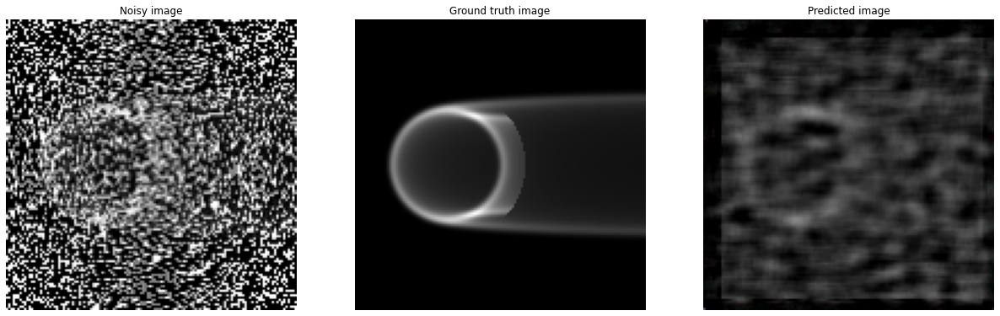

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s60")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 6.610032128617181
Predicted average gt-predicted PSNR -> 16.0208254620502
Original average gt-noisy SSIM -> 0.020360506280832563
Predicted average gt-predicted SSIM -> 0.13277377677433977


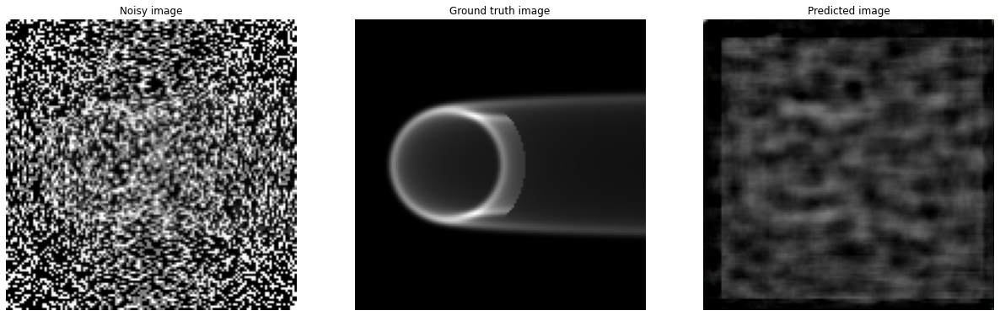

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s70")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 6.172902224570605
Predicted average gt-predicted PSNR -> 15.253331842553992
Original average gt-noisy SSIM -> 0.013540809663124398
Predicted average gt-predicted SSIM -> 0.0883795515134045


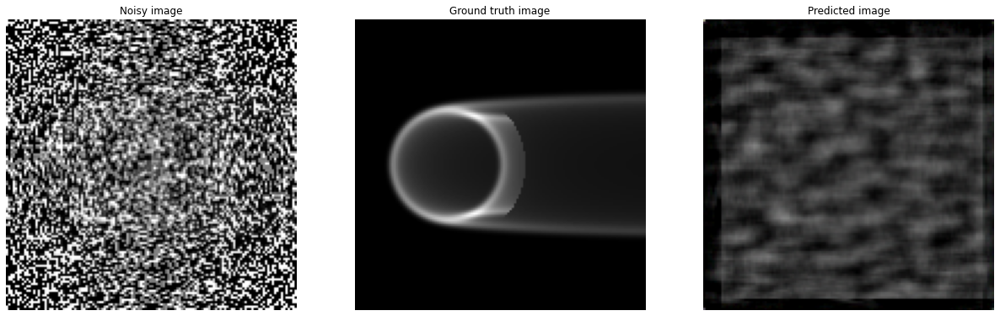

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s80")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 32.645023211992765
Predicted average gt-predicted PSNR -> 23.990671199433674
Original average gt-noisy SSIM -> 0.9005081142956931
Predicted average gt-predicted SSIM -> 0.7079536502982752


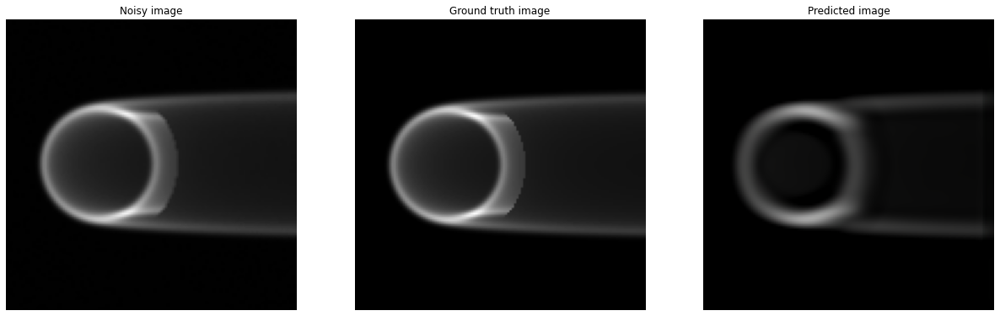

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g10")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 31.992104203085635
Predicted average gt-predicted PSNR -> 24.164156467887135
Original average gt-noisy SSIM -> 0.7176870617721635
Predicted average gt-predicted SSIM -> 0.6625254689863379


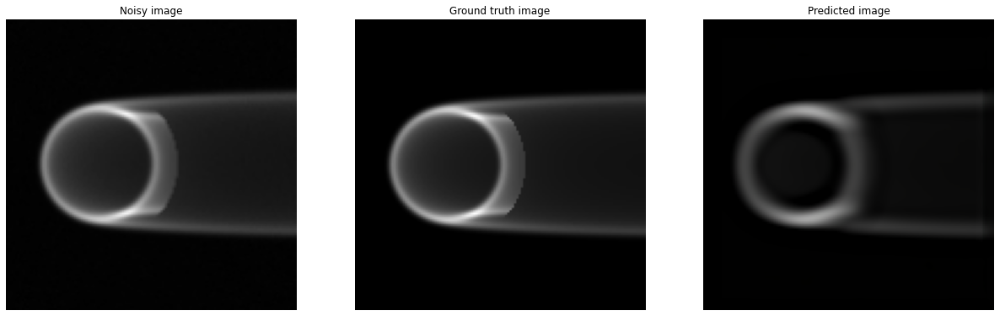

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g20")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 31.992104203085635
Predicted average gt-predicted PSNR -> 24.164156467887135
Original average gt-noisy SSIM -> 0.7176870617721635
Predicted average gt-predicted SSIM -> 0.6625254689863379


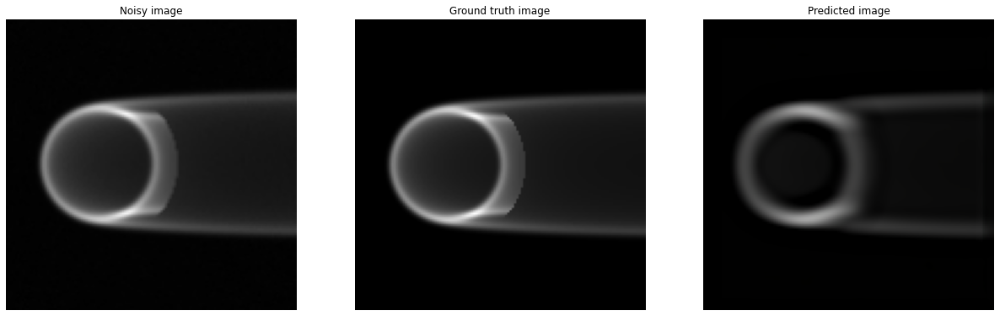

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g20")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 31.049839972771302
Predicted average gt-predicted PSNR -> 24.303482321663292
Original average gt-noisy SSIM -> 0.5896912298909927
Predicted average gt-predicted SSIM -> 0.6031763040487449


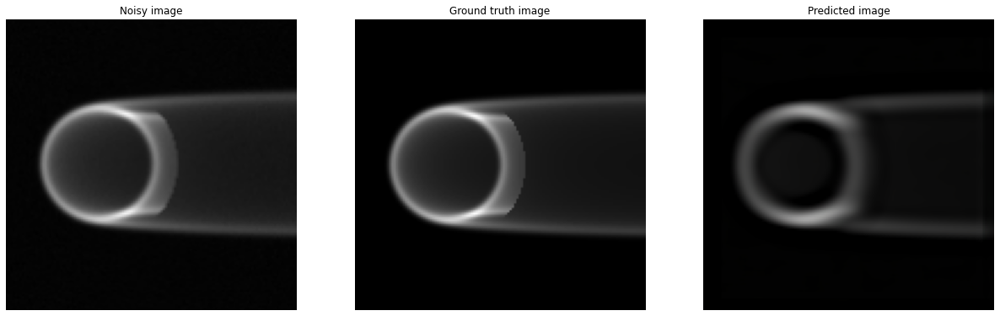

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g30")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 30.348054276838084
Predicted average gt-predicted PSNR -> 24.422938634232988
Original average gt-noisy SSIM -> 0.5498693663934593
Predicted average gt-predicted SSIM -> 0.5761808279530345


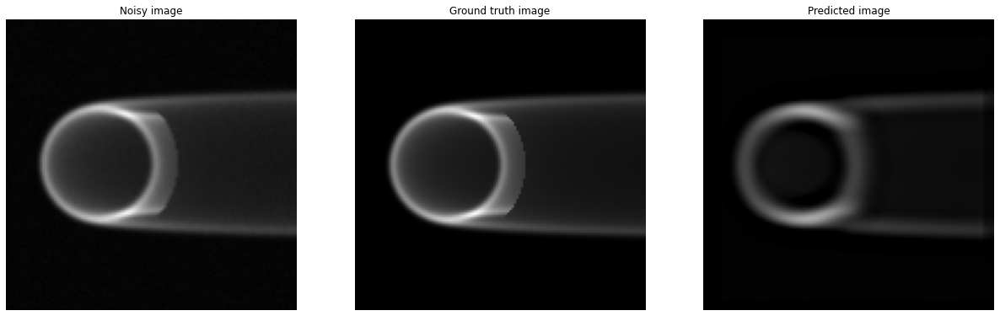

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)


Original average gt-noisy PSNR -> 29.837137606252888
Predicted average gt-predicted PSNR -> 24.43625323142136
Original average gt-noisy SSIM -> 0.5215898614612334
Predicted average gt-predicted SSIM -> 0.5538001725480969


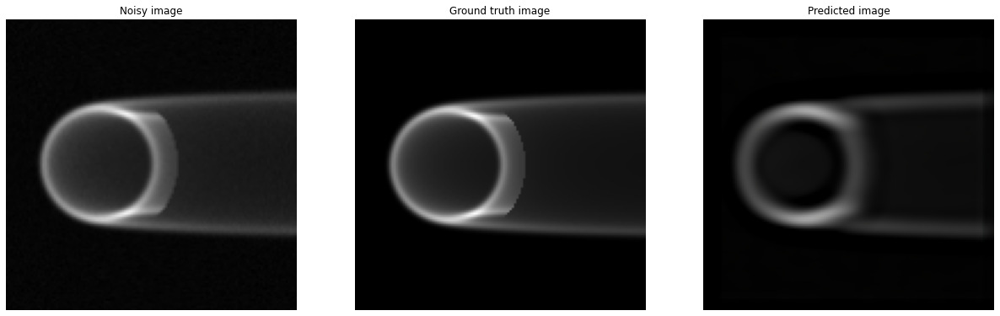

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g50")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 28.450140321394425
Predicted average gt-predicted PSNR -> 24.66806504194971
Original average gt-noisy SSIM -> 0.48455871975101233
Predicted average gt-predicted SSIM -> 0.5240618884415729


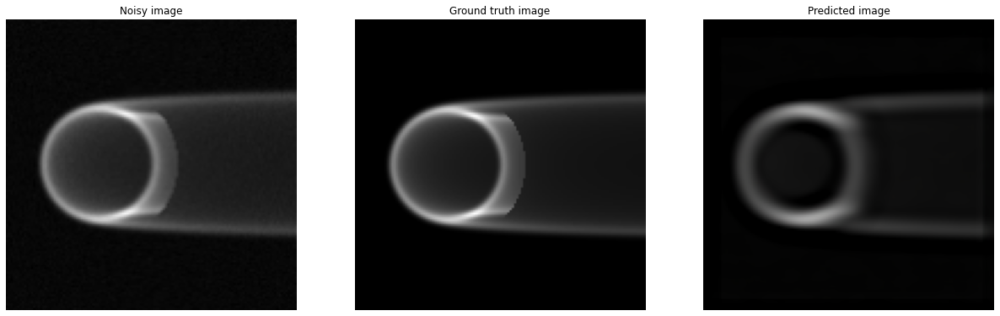

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g60")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 26.891310726576613
Predicted average gt-predicted PSNR -> 24.728186705179404
Original average gt-noisy SSIM -> 0.45496089628848285
Predicted average gt-predicted SSIM -> 0.49391186458141617


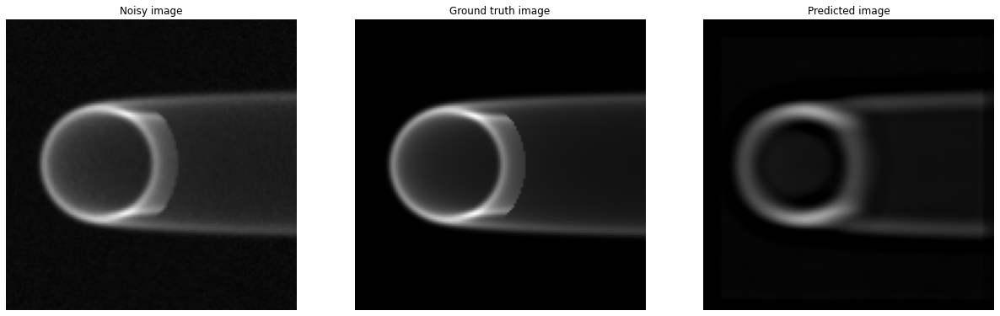

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g70")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 26.70169885773857
Predicted average gt-predicted PSNR -> 24.811539404613264
Original average gt-noisy SSIM -> 0.4484739101958553
Predicted average gt-predicted SSIM -> 0.4921534257340814


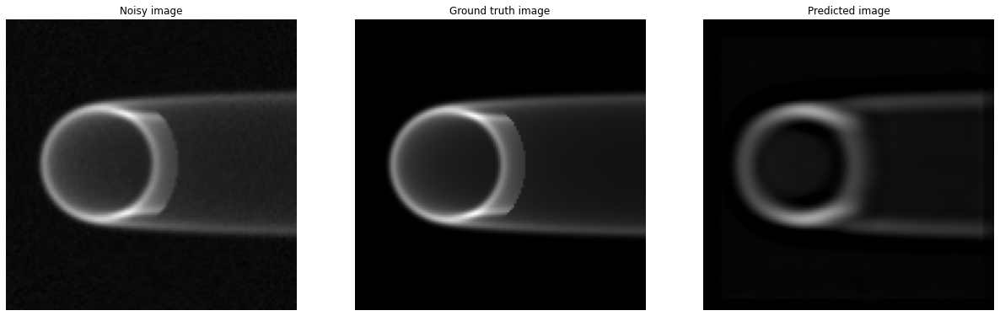

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g80")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 32.480120353005105
Predicted average gt-predicted PSNR -> 24.05385656697601
Original average gt-noisy SSIM -> 0.8532651415552023
Predicted average gt-predicted SSIM -> 0.7005546088975055


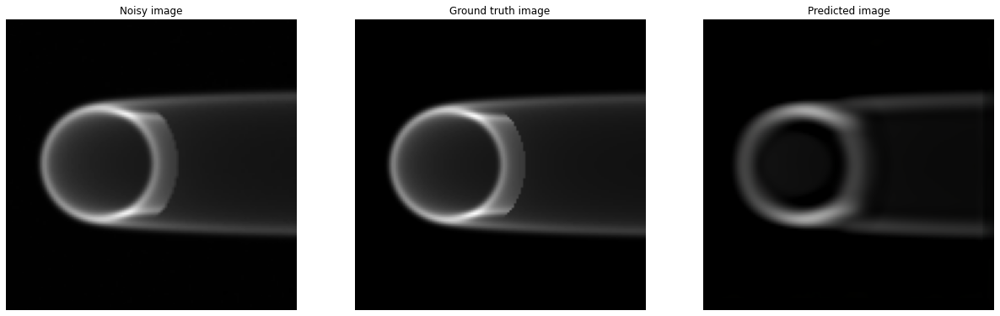

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p10")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 31.54574638181726
Predicted average gt-predicted PSNR -> 24.225896763228935
Original average gt-noisy SSIM -> 0.6402435703597179
Predicted average gt-predicted SSIM -> 0.6297927901612681


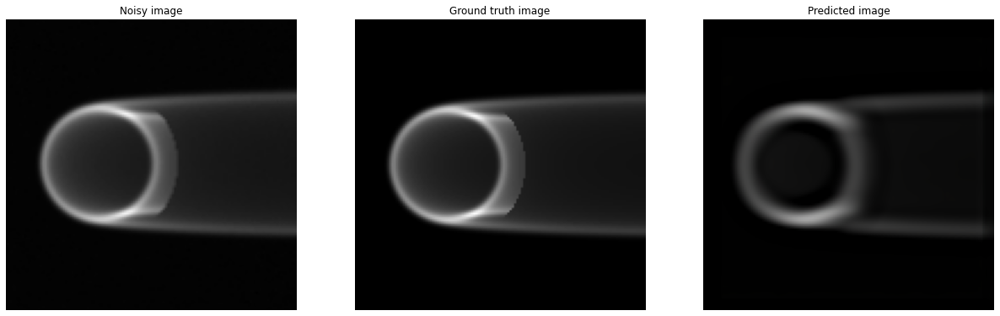

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p20")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 30.277114185877853
Predicted average gt-predicted PSNR -> 24.425548667680978
Original average gt-noisy SSIM -> 0.5447035097690273
Predicted average gt-predicted SSIM -> 0.5683236048280319


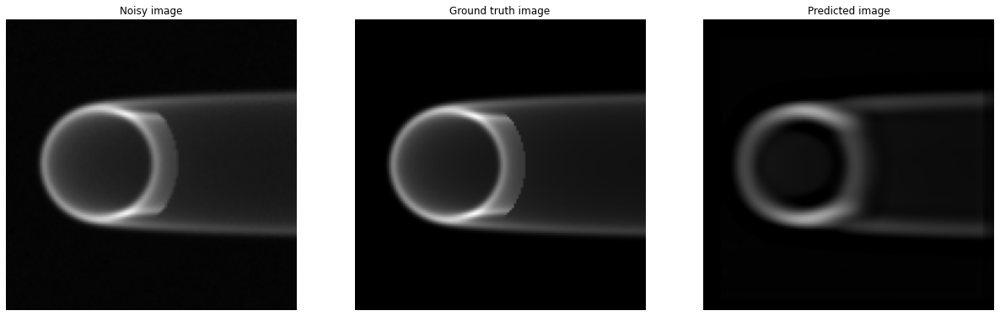

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p30")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 28.915545457462656
Predicted average gt-predicted PSNR -> 24.590056395254216
Original average gt-noisy SSIM -> 0.4984781119879527
Predicted average gt-predicted SSIM -> 0.5289277394186024


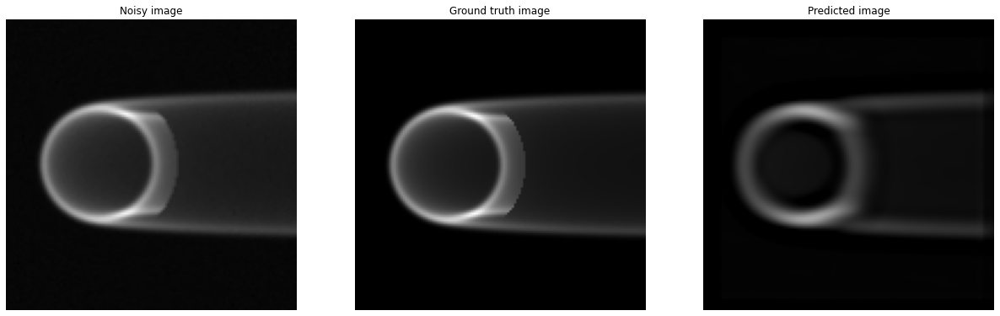

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 28.439412130223197
Predicted average gt-predicted PSNR -> 24.64343831840109
Original average gt-noisy SSIM -> 0.48524762044662434
Predicted average gt-predicted SSIM -> 0.5190496237380177


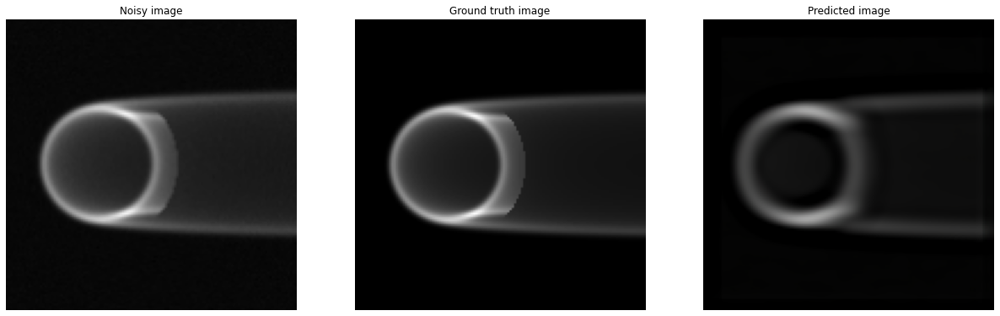

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p50")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)


Original average gt-noisy PSNR -> 26.506632092944034
Predicted average gt-predicted PSNR -> 24.849341945844156
Original average gt-noisy SSIM -> 0.4539462278128801
Predicted average gt-predicted SSIM -> 0.4911731623781373


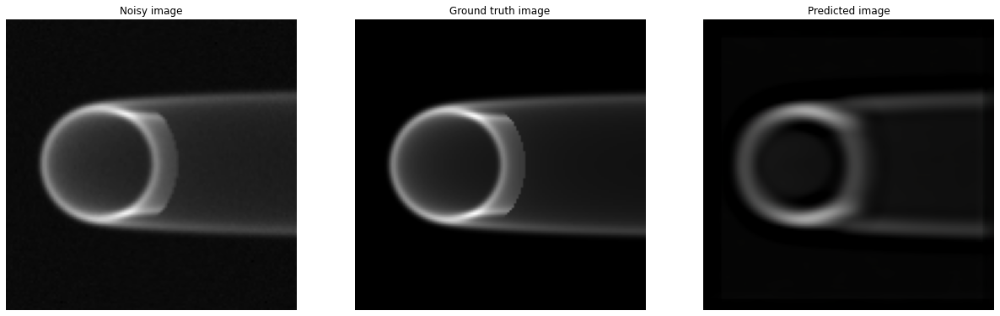

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p60")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 25.467015639063998
Predicted average gt-predicted PSNR -> 24.95371205899626
Original average gt-noisy SSIM -> 0.44127795049965973
Predicted average gt-predicted SSIM -> 0.48270634845073035


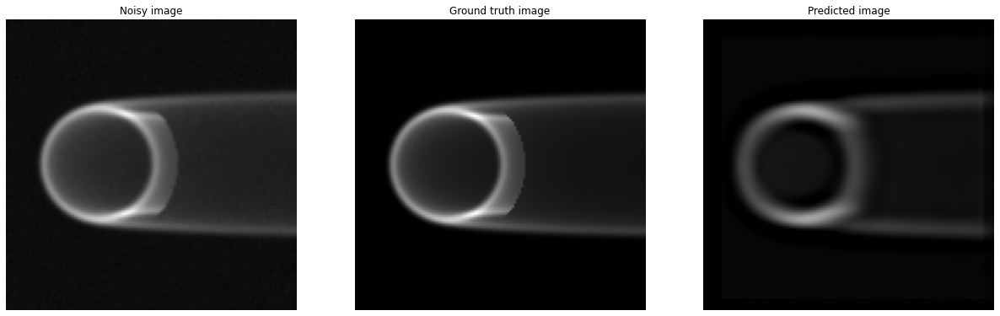

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p70")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 128, 128, 3)
(1, 128, 128, 3)
Original average gt-noisy PSNR -> 25.971434963281382
Predicted average gt-predicted PSNR -> 24.772171761460488
Original average gt-noisy SSIM -> 0.4439433145477223
Predicted average gt-predicted SSIM -> 0.48016413099071603


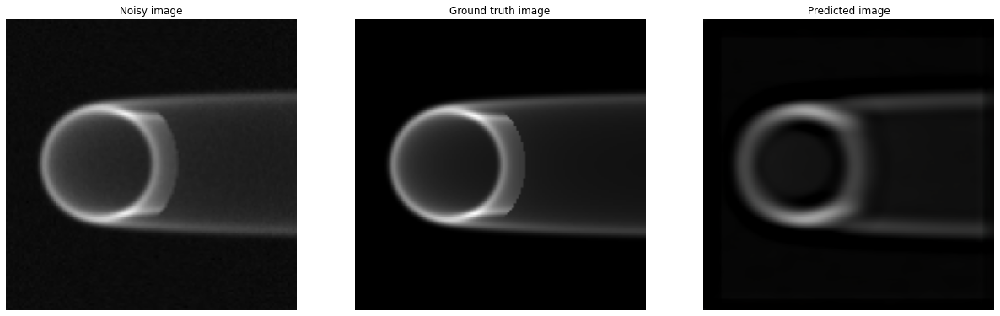

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p80")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

(10, 128, 128, 3)
(10, 128, 128, 3)


Original average gt-noisy PSNR -> 9.400364353105171
Predicted average gt-predicted PSNR -> 19.754106325996677
Original average gt-noisy SSIM -> 0.05374584010741479
Predicted average gt-predicted SSIM -> 0.21043310596502057


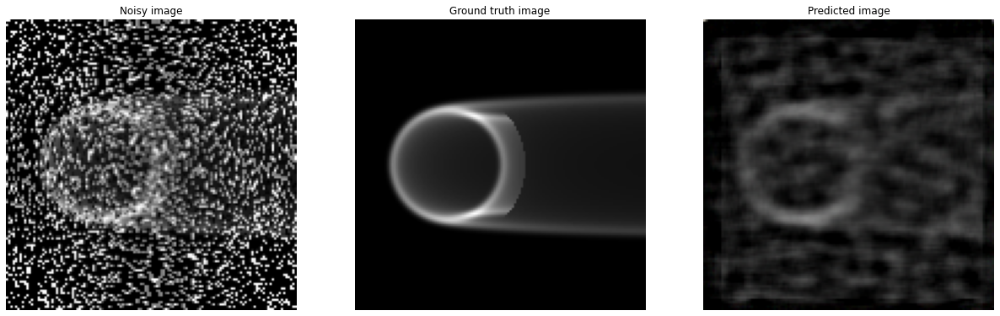

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../s40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

(10, 128, 128, 3)
(10, 128, 128, 3)


Original average gt-noisy PSNR -> 30.252170859925645
Predicted average gt-predicted PSNR -> 24.419683633295495
Original average gt-noisy SSIM -> 0.54507345496411
Predicted average gt-predicted SSIM -> 0.5712329266743192


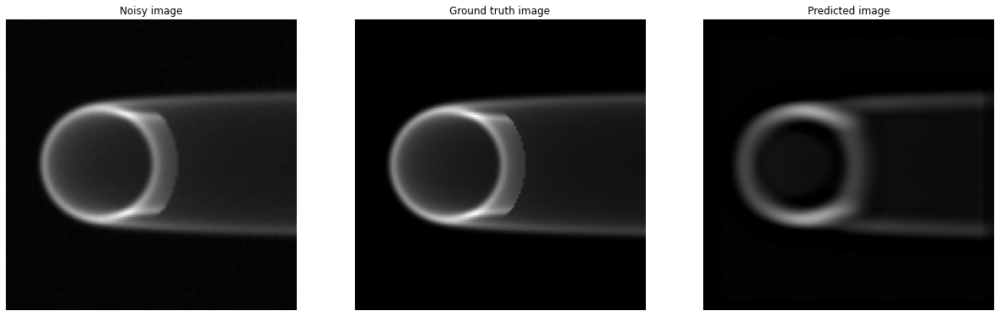

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

(10, 128, 128, 3)
(10, 128, 128, 3)


Original average gt-noisy PSNR -> 29.16757517337636
Predicted average gt-predicted PSNR -> 24.558424936898415
Original average gt-noisy SSIM -> 0.5048314502573271
Predicted average gt-predicted SSIM -> 0.5350135448532105


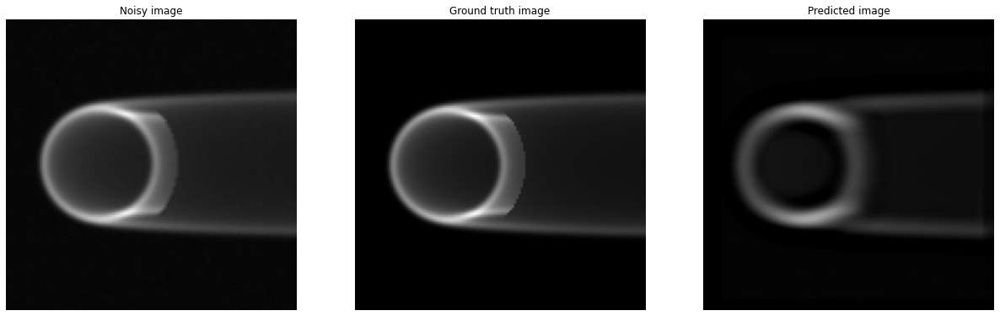

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../p40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

(10, 128, 128, 3)
(10, 128, 128, 3)


Original average gt-noisy PSNR -> 9.674182537635847
Predicted average gt-predicted PSNR -> 19.4827100032891
Original average gt-noisy SSIM -> 0.056249674066661225
Predicted average gt-predicted SSIM -> 0.208912382805324


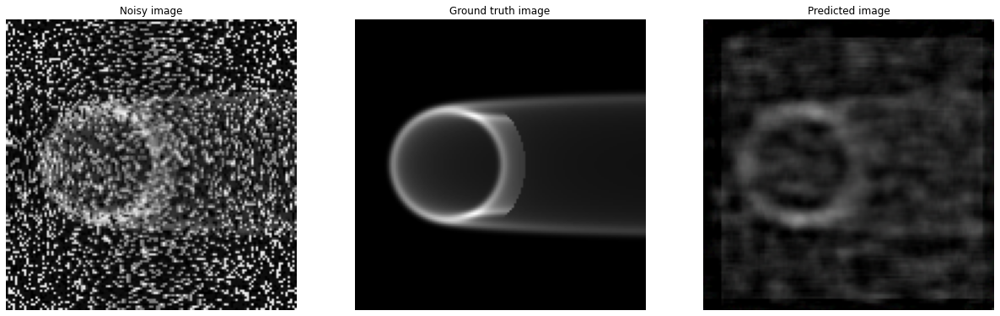

In [ ]:
noisy_test_paths1, gt_test_paths1 = get_images_paths("../g40_p40_s40")

noisy_test_images1 = get_images_in_mem(noisy_test_paths1)
gt_test_images1 = get_images_in_mem(gt_test_paths1)

print(noisy_test_images1.shape)
print(gt_test_images1.shape)

visualize_predictions(model, noisy_test_images1, gt_test_images1, 1)

from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images1)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images1.shape[0]
psnr_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images1)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images1, noisy_test_images1, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images1.shape[0]
ssim_prediction_mean/=gt_test_images1.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)


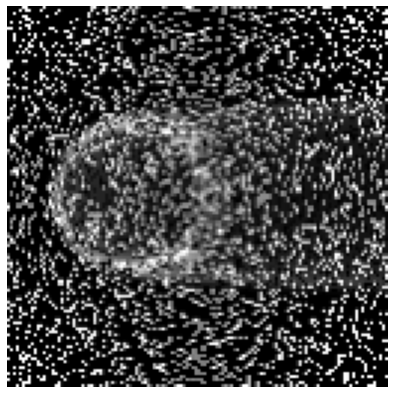

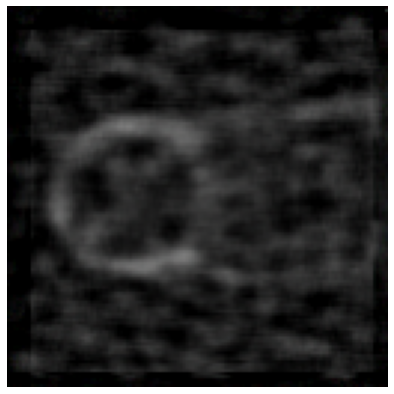

In [ ]:
img_path = "../s40/s40_8.png"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (128, 128))

predicted_image = inference_single_image(model, img)
predicted_image/=255

f, axarr = plt.subplots(1,1, figsize=(7,7))
axarr.imshow(img)
axarr.set_axis_off()
plt.savefig('s40_noisy.png', bbox_inches='tight',pad_inches=0,dpi=100)

f, axarr1 = plt.subplots(1,1, figsize=(7,7))
axarr1.imshow(predicted_image)
axarr1.set_axis_off()
plt.savefig('s40_pred.png', bbox_inches='tight',pad_inches=0,dpi=100)

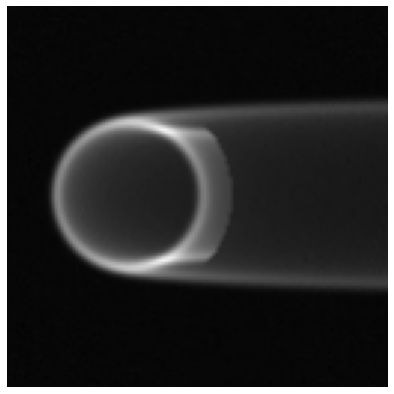

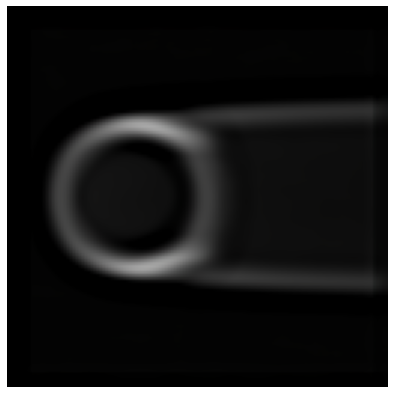

In [ ]:
img_path = "../p40/p40_8.png"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (128, 128))

predicted_image = inference_single_image(model, img)
predicted_image/=255

f, axarr = plt.subplots(1,1, figsize=(7,7))
axarr.imshow(img)
axarr.set_axis_off()
plt.savefig('p40_noisy.png', bbox_inches='tight',pad_inches=0,dpi=100)

f, axarr1 = plt.subplots(1,1, figsize=(7,7))
axarr1.imshow(predicted_image)
axarr1.set_axis_off()
plt.savefig('p40_pred.png', bbox_inches='tight',pad_inches=0,dpi=100)

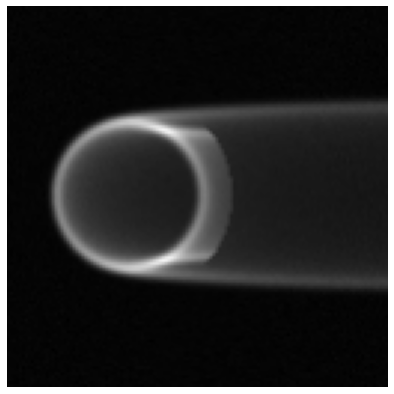

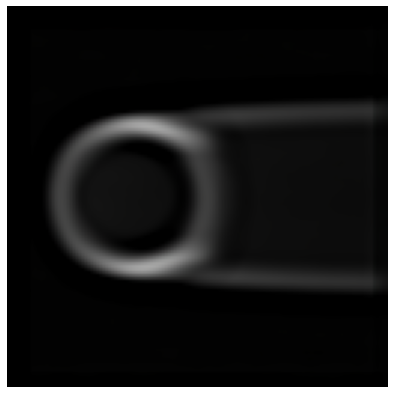

In [ ]:
img_path = "../g40/g40_8.png"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (128, 128))

predicted_image = inference_single_image(model, img)
predicted_image/=255

f, axarr = plt.subplots(1,1, figsize=(7,7))
axarr.imshow(img)
axarr.set_axis_off()
plt.savefig('g40_noisy.png', bbox_inches='tight',pad_inches=0,dpi=100)

f, axarr1 = plt.subplots(1,1, figsize=(7,7))
axarr1.imshow(predicted_image)
axarr1.set_axis_off()
plt.savefig('g40_pred.png', bbox_inches='tight',pad_inches=0,dpi=100)